# Import Modules

In [1]:
import glob
import os
import subprocess
import numpy as np
import numpy.random as npr
import matplotlib.pyplot as plt
import scipy.optimize as optimize
from PIL import Image

import pandas as pd
from functools import partial
from tqdm.notebook import trange, tqdm
# from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
import timeit, random
# import umap
# import umap.plot

import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import Dataset, DataLoader, TensorDataset, Subset
torch.backends.cudnn.benchmark = True
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
import sys
sys.path.insert(0, os.path.join(os.path.expanduser('~/Research/Github/'),'PyTorch-VAE'))
from datasets import WCDataset, WCShotgunDataset

from models import VanillaVAE


import matplotlib as mpl
mpl.rcParams.update({'font.size':         24,
                     'axes.linewidth':    3,
                     'xtick.major.size':  5,
                     'xtick.major.width': 2,
                     'ytick.major.size':  5,
                     'ytick.major.width': 2,
                     'axes.spines.right': False,
                     'axes.spines.top':   False,
                     'font.sans-serif':  "Arial",
                     'font.family':      "sans-serif",
                    })

########## Checks if path exists, if not then creates directory ##########
def check_path(basepath, path):
    if path in basepath:
        return basepath
    elif not os.path.exists(os.path.join(basepath, path)):
        os.makedirs(os.path.join(basepath, path))
        print('Added Directory:'+ os.path.join(basepath, path))
        return os.path.join(basepath, path)
    else:
        return os.path.join(basepath, path)

    
rootdir = os.path.expanduser('~/Research/FMEphys/')

# Set up partial functions for directory managing
join = partial(os.path.join,rootdir)
checkDir = partial(check_path,rootdir)
FigurePath = checkDir('Figures')


savefigs=False



# Dataset 

In [2]:
def create_train_val_csv(TrainSet,ValSet):
    ExpDir = []
    DNum = []
    for exp in TrainSet:
        DataPaths = sorted(glob.glob(join(exp,'*.png')))
        print('{}: '.format(exp),len(DataPaths))
        for n in range(len(DataPaths)):
            ExpDir.append(DataPaths[n].split('/')[-2])
            DNum.append(DataPaths[n].split('/')[-1])

    df_train = pd.DataFrame({'BasePath':ExpDir,'FileName':DNum})
    df_train.to_csv(join('WC_Train_Data.csv'))

    print('Total Training Size: ', len(df_train))


    ExpDir = []
    DNum = []
    for exp in ValSet:
        DataPaths = sorted(glob.glob(join(exp,'*.png')))
        print('{}: '.format(exp),len(DataPaths))
        for n in range(len(DataPaths)):
            ExpDir.append(DataPaths[n].split('/')[-2])
            DNum.append(DataPaths[n].split('/')[-1])

    df_val = pd.DataFrame({'BasePath':ExpDir,'FileName':DNum})
    df_val.to_csv(join('WC_Val_Data.csv'))

    print('Total Validation Size: ', len(df_val))
    return df_train, df_val


def create_train_val_csv_shotgun(TrainSet,ValSet,N_fm=4):
    ExpDir = []
    DNum = []
    for exp in TrainSet:
        DataPaths = sorted(glob.glob(join(exp,'*.png')))
        print('{}: '.format(exp),len(DataPaths))
        for n in range(len(DataPaths)):
            if n < N_fm: 
                DNum_temp = [DataPaths[0].split('/')[-1] for t in range(N_fm-n)]
                DNum_temp = sorted(DNum_temp + [DataPaths[n-t].split('/')[-1] for t in range(N_fm - len(DNum_temp))])
                DNum.append(DNum_temp)
            else:
                DNum.append([DataPaths[n+t-N_fm+1].split('/')[-1] for t in range(N_fm)])
            ExpDir.append(DataPaths[n].split('/')[-2])
    df_train = pd.DataFrame({'BasePath':ExpDir,'FileName':DNum})
    df_train.to_csv(join('WCShotgun_Train_Data.csv'))

    print('Total Training Size: ', len(df_train))


    ExpDir = []
    DNum = []
    for exp in ValSet:
        DataPaths = sorted(glob.glob(join(exp,'*.png')))
        print('{}: '.format(exp),len(DataPaths))
        for n in range(len(DataPaths)):
            if n < N_fm: 
                DNum_temp = [DataPaths[0].split('/')[-1] for t in range(N_fm-n)]
                DNum_temp = sorted(DNum_temp + [DataPaths[n-t].split('/')[-1] for t in range(N_fm - len(DNum_temp))])
                DNum.append(DNum_temp)
            else:
                DNum.append([DataPaths[n+t-N_fm+1].split('/')[-1] for t in range(N_fm)])
            ExpDir.append(DataPaths[n].split('/')[-2])
    df_val = pd.DataFrame({'BasePath':ExpDir,'FileName':DNum})
    df_val.to_csv(join('WCShotgun_Val_Data.csv'))

    print('Total Validation Size: ', len(df_val))
    return df_train, df_val

In [30]:
for exp in TrainSet:
    DataPaths = sorted(glob.glob(join(exp,'*.png')))
    for n in range(len(DataPaths)):
#         if len(os.path.basename(DataPaths[n]).split('_')[-1]) < 10:
#         os.remove(DataPaths[n])

In [151]:
rootdir = os.path.expanduser('~/Research/FMEphys/')

join = partial(os.path.join,rootdir)

TrainSet = sorted([os.path.basename(x) for x in glob.glob(join('*WORLD'))])

valnum = np.random.randint(len(TrainSet))

ValSet = [TrainSet[valnum]]

TrainSet.pop(valnum)

df_train,df_val = create_train_val_csv_shotgun(TrainSet,ValSet)

['012221_G6H30P3LN_control_Rig2_fm1_WORLD', '012521_EE8P6LT_control_Rig2_fm1_WORLD', '012621_EE8P6LT_control_Rig2_fm1_WORLD', '012821_EE8P6LT_control_Rig2_fm1_WORLD', '020321_EE13P1RT_control_Rig2_fm1_WORLD', '020821_EE12P1RN_control_Rig2_fm1_WORLD', '020921_EE12P1NN_control_Rig2_fm1_WORLD', '020921_EE12P1RN_control_Rig2_fm1_WORLD', '021121_EE12P1NN_control_Rig2_fm1_WORLD', '021521_EE11P11LT_control_Rig2_fm2_WORLD', '022421_EE13P2RT_control_Rig2_fm1_WORLD', '030821_EE8P7LT_control_Rig2_fm1_WORLD', '030821_EE8P7RT_control_Rig2_fm1_WORLD', '030921_EE11P13LTRN_control_Rig2_fm1_WORLD', '031021_EE11P13LTRN_control_Rig2_fm1_WORLD']
012221_G6H30P3LN_control_Rig2_fm1_WORLD:  107162
107162
012521_EE8P6LT_control_Rig2_fm1_WORLD:  131304
238466
012621_EE8P6LT_control_Rig2_fm1_WORLD:  15030
253496
012821_EE8P6LT_control_Rig2_fm1_WORLD:  251330
504826
020321_EE13P1RT_control_Rig2_fm1_WORLD:  111564
616390
020821_EE12P1RN_control_Rig2_fm1_WORLD:  109686
726076
020921_EE12P1NN_control_Rig2_fm1_WORLD:

In [127]:
from torchvision import transforms

def pil_loader(path):
    with open(path, 'rb') as f:
        with Image.open(f) as img:
            return img.convert('RGB')
    
class WCDataset(Dataset):
    def __init__(self, csv_file, root_dir, transform=None):
        
        self.data_paths = pd.read_csv(csv_file)
        self.root_dir = root_dir
        self.transform = transform
        

    def __len__(self):
        return(len(self.data_paths))
    
    def __getitem__(self,idx):
        if torch.is_tensor(idx):
            idx = idx.tolist()
        img_name = os.path.join(self.root_dir,self.data_paths.iloc[idx,1],self.data_paths.iloc[idx,2])
        sample = pil_loader(img_name)
        
        if self.transform:
            sample = self.transform(sample)
            
        return sample
    
class WCShotgunDataset(Dataset):
    def __init__(self, csv_file, N_fm, root_dir, transform=None):
        
        self.data_paths = pd.read_csv(csv_file)
        self.root_dir = root_dir
        self.transform = transform
        self.N_fm = N_fm

    def __len__(self):
        return(len(self.data_paths))
    
    def __getitem__(self,idx):
        if torch.is_tensor(idx):
            idx = idx.tolist()
        
        sample=[]
        for n in range(self.N_fm):
            img_name = eval(self.data_paths['FileName'][idx])[n]
            img_path = os.path.join(self.root_dir,self.data_paths.iloc[idx,1],img_name)
            img = pil_loader(img_path)
            if self.transform:
                img = self.transform(img)
            sample.append(img)
        sample = torch.cat(sample,dim=0)
        return sample

In [137]:
size = (64,64)
SetRange = transforms.Lambda(lambda X: 2 * X - 1.)
transform = transforms.Compose([
                    transforms.Grayscale(num_output_channels=1),
                    transforms.Resize(size),
                    transforms.ToTensor(),
                    SetRange])


WC_dataset = WCShotgunDataset(csv_file=join('WCShotgun_Train_Data.csv'),root_dir=rootdir,N_fm=4,transform=transform)

In [129]:
dataloader_train = DataLoader(WC_dataset,
                              batch_size= 64,
                              shuffle = False,
                              drop_last=True,
                              num_workers=32,
                            #   persistent_workers=True,
                              pin_memory=True,
                              prefetch_factor=5)

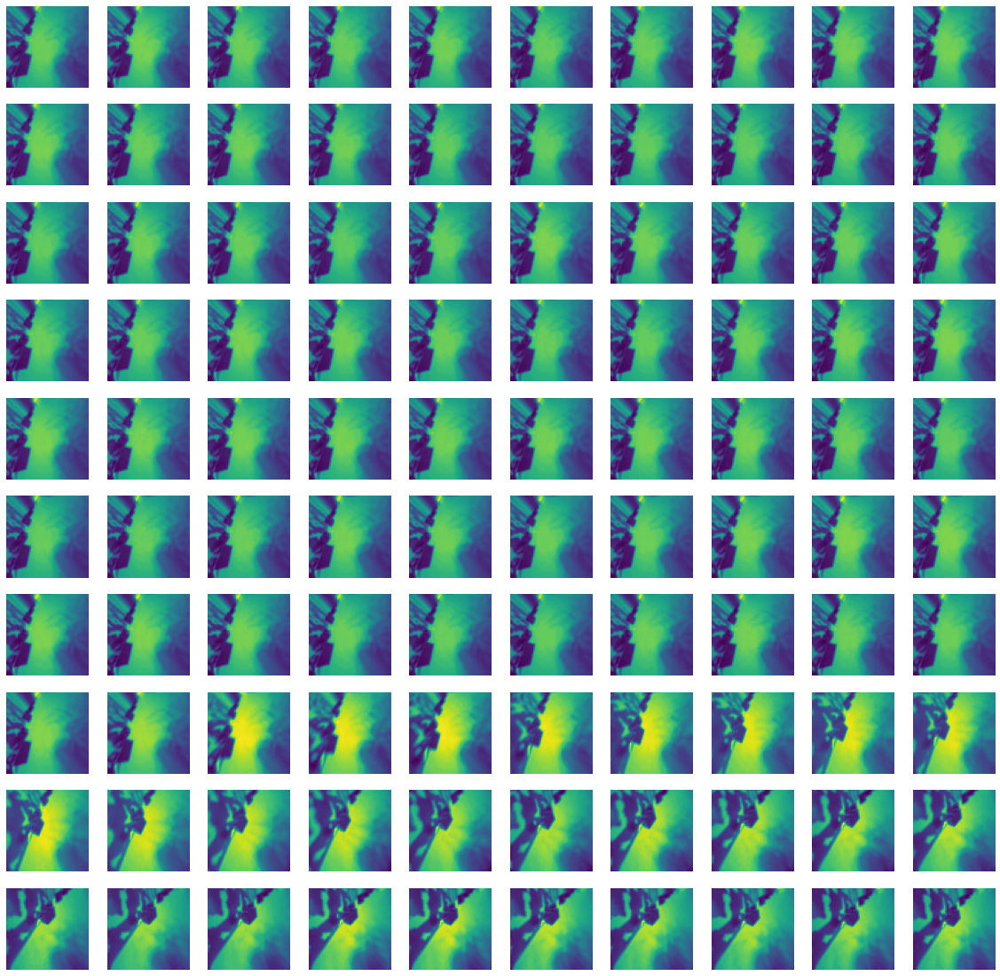

In [133]:
fig,axs = plt.subplots(10,10,figsize=(20,20))
axs=axs.flatten()
st = np.random.randint(len(WC_dataset))
for n in range(len(axs)):
    im = WC_dataset[st+n]
    axs[n].imshow(im[1:2].permute(1,2,0))
    axs[n].axis('off')

# Load Trained Network

In [2]:
from models.vanilla_vae import VanillaVAE
from experiment import VAEXperiment
import yaml
import torchvision

In [3]:
filename =  os.path.join(os.path.expanduser('~/Research/Github/'),'PyTorch-VAE','configs/WC_vae.yaml')
ckpt_path = glob.glob(os.path.expanduser('~/Research/FMEphys/logs2/VanillaVAE/version_1/checkpoints/*.ckpt'))[0]
print(ckpt_path)
with open(filename, 'r') as file:
    try:
        config = yaml.safe_load(file)
    except yaml.YAMLError as exc:
        print(exc)
config

/home/seuss/Research/FMEphys/logs2/VanillaVAE/version_1/checkpoints/epoch=186-step=290859.ckpt


{'model_params': {'name': 'VanillaVAE', 'in_channels': 4, 'latent_dim': 128},
 'exp_params': {'dataset': 'WorldCamShotgun',
  'data_path': '/home/seuss/Research/FMEphys/',
  'csv_path_train': '/home/seuss/Research/FMEphys/WCShotgun_Train_Data.csv',
  'csv_path_val': '/home/seuss/Research/FMEphys/WCShotgun_Val_Data.csv',
  'imgH_size': 64,
  'imgW_size': 64,
  'batch_size': 1024,
  'LR': 0.001,
  'weight_decay': 0.0,
  'scheduler_gamma': 1,
  'in_channels': 4},
 'trainer_params': {'gpus': 1, 'max_epochs': 500},
 'logging_params': {'save_dir': '/home/seuss/Research/FMEphys/logs2/',
  'name': 'VanillaVAE',
  'manual_seed': 1265}}

In [4]:
model = VanillaVAE(**config['model_params'])
experiment = VAEXperiment(model,config['exp_params'])

experiment = experiment.load_from_checkpoint(ckpt_path,vae_model=model,params=config['exp_params'])
experiment.to(device)

VAEXperiment(
  (model): VanillaVAE(
    (encoder): Sequential(
      (0): Sequential(
        (0): Conv2d(4, 128, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
        (1): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (2): LeakyReLU(negative_slope=0.01)
      )
      (1): Sequential(
        (0): Conv2d(128, 256, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
        (1): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (2): LeakyReLU(negative_slope=0.01)
      )
      (2): Sequential(
        (0): Conv2d(256, 512, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
        (1): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (2): LeakyReLU(negative_slope=0.01)
      )
      (3): Sequential(
        (0): Conv2d(512, 1024, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
        (1): BatchNorm2d(1024, eps=1e-05, momentum=0.1, affine=True, track_running_

In [44]:
dataset[0]


tensor([[[-0.1686, -0.0745, -0.1451,  ..., -0.5059, -0.4824, -0.4902],
         [-0.0510, -0.0275, -0.0667,  ..., -0.5216, -0.4745, -0.4431],
         [-0.1137, -0.0588, -0.0118,  ..., -0.4902, -0.4353, -0.4353],
         ...,
         [-0.2392, -0.1059, -0.0196,  ..., -0.3647, -0.3725, -0.4118],
         [-0.3020, -0.1843, -0.1529,  ..., -0.3569, -0.3569, -0.4275],
         [-0.3961, -0.2235, -0.1686,  ..., -0.3804, -0.3725, -0.4196]],

        [[-0.1686, -0.0745, -0.1451,  ..., -0.5059, -0.4824, -0.4902],
         [-0.0510, -0.0275, -0.0667,  ..., -0.5216, -0.4745, -0.4431],
         [-0.1137, -0.0588, -0.0118,  ..., -0.4902, -0.4353, -0.4353],
         ...,
         [-0.2392, -0.1059, -0.0196,  ..., -0.3647, -0.3725, -0.4118],
         [-0.3020, -0.1843, -0.1529,  ..., -0.3569, -0.3569, -0.4275],
         [-0.3961, -0.2235, -0.1686,  ..., -0.3804, -0.3725, -0.4196]],

        [[-0.1686, -0.0745, -0.1451,  ..., -0.5059, -0.4824, -0.4902],
         [-0.0510, -0.0275, -0.0667,  ..., -0

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


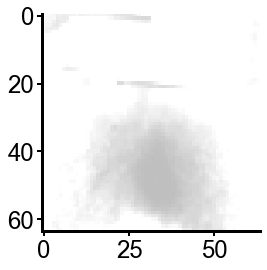

In [58]:
plt.imshow(dataset[205200].numpy().transpose((1,2,0)))

In [25]:
NumBatches= 5
config['exp_params']['batch_size'] = 1024
val_dataloader = experiment.val_dataloader()
dataset = WCShotgunDataset(root_dir = config['exp_params']['data_path'],
                            csv_file = config['exp_params']['csv_path_train'],
                            N_fm=config['exp_params']['in_channels'],
                            transform=experiment.data_transforms())
train_dataset = Subset(dataset,torch.arange(config['exp_params']['batch_size']*NumBatches))
train_dataloader = DataLoader(train_dataset,
                              batch_size= config['exp_params']['batch_size'],
                              shuffle = True,
                              drop_last=True,
                              num_workers=32,
                              pin_memory=False,)

In [26]:

zt = np.empty((NumBatches,config['exp_params']['batch_size'],config['model_params']['latent_dim']))
recont = np.empty((NumBatches,config['exp_params']['batch_size'],config['exp_params']['in_channels'],config['exp_params']['imgH_size'],config['exp_params']['imgW_size']))
batcht = np.empty((NumBatches,config['exp_params']['batch_size'],config['exp_params']['in_channels'],config['exp_params']['imgH_size'],config['exp_params']['imgW_size']))

for n, batch in enumerate(tqdm(train_dataloader)):   
    z,recon,inputs,_,_ = model.grab_latents(batch.to(device))
    zt[n] = z.cpu().detach().numpy()
    recont[n] = recon.cpu().detach().numpy().squeeze()
    batcht[n] = inputs.cpu().detach().numpy()

  0%|          | 0/5 [00:00<?, ?it/s]

In [16]:
batcht.shape,recont.shape,zt.shape

((100, 1024, 4, 64, 64), (100, 1024, 4, 64, 64), (100, 1024, 128))

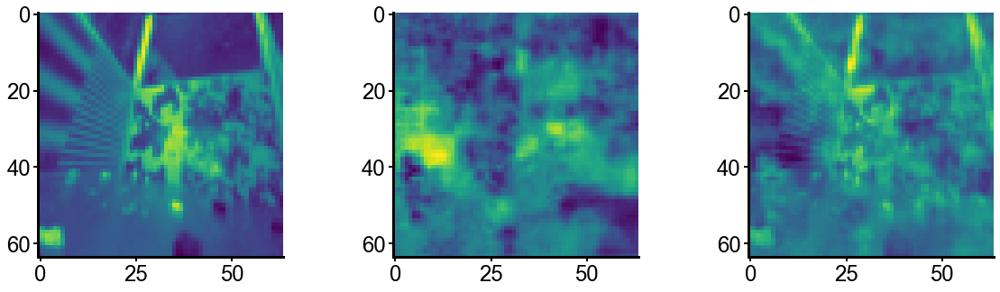

In [28]:
Bn=-1
n=0

b1 = batcht[Bn,n].transpose(1,2,0)
b1 = (b1-b1.min())/(b1.max()-b1.min())
r1 = recont[Bn,n].transpose(1,2,0)
r1 = (r1-r1.min())/(r1.max()-r1.min())
temp = (b1-r1)

# temp = (temp-temp.min())/(temp.max()-temp.min())

fig,axs = plt.subplots(1,3,figsize=(20,5))
axs[0].imshow(b1[:,:,0])
axs[1].imshow(r1[:,:,0])
axs[2].imshow(temp[:,:,0])

In [8]:
torch.mean((batch.cuda()[0]-recon.cuda()[0])**2)

tensor(0.0585, device='cuda:0', grad_fn=<MeanBackward0>)

In [9]:
import plotly.express as px
import plotly.graph_objects as go


In [10]:
b1 = batch.cpu()[:100].detach().numpy().squeeze()
b1 = (b1-b1.min())/(b1.max()-b1.min())
r1 = recon.cpu()[:100].detach().numpy().squeeze()
r1 = (r1-r1.min())/(r1.max()-r1.min())
b1r1 = np.stack((b1,r1))
b1r1.shape

(2, 100, 4, 64, 64)

In [11]:
fig = px.imshow(b1r1,animation_frame=1,facet_col=0, binary_string=True)
fig.layout.annotations[0]['text'] = 'Frame'
fig.layout.annotations[1]['text'] = 'Recon'
fig.update_layout(width=500,
                  height=400,
                 )
fig.show()

IndexError: list index out of range

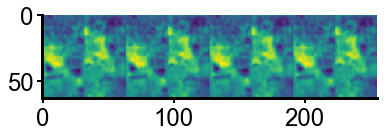

In [8]:
t=50

plt.imshow(np.hstack(recont[0,t]))

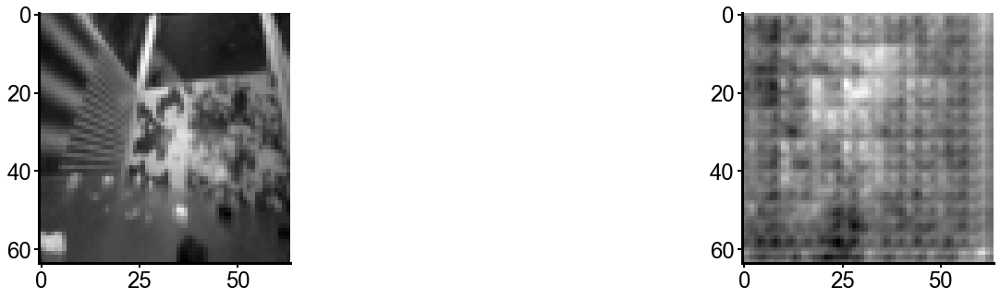

In [8]:
t=0

fig, axs = plt.subplots(1,2,figsize=(25,5))
im_grid = torchvision.utils.make_grid(batch.cpu()[t,:1],nrow=10,normalize=True)


axs[0].imshow(im_grid.permute(1,2,0))


im_grid2 = torchvision.utils.make_grid(recon.cpu()[t,:1],nrow=10,normalize=True)

axs[1].imshow(im_grid2.permute(1,2,0))

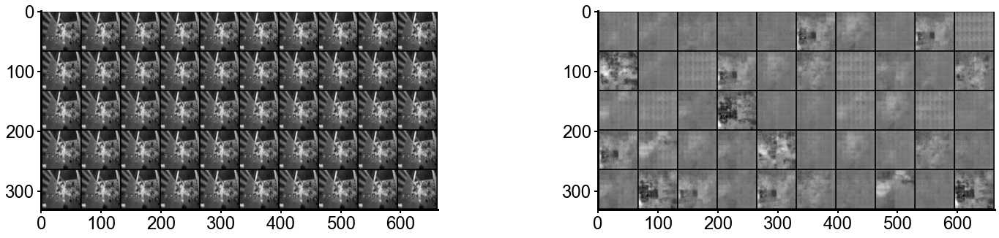

In [18]:
t=0
fig, axs = plt.subplots(1,2,figsize=(25,5))
im_grid = torchvision.utils.make_grid(batch.cpu()[t:t+50,:1],nrow=10,normalize=True)


axs[0].imshow(im_grid.permute(1,2,0))


im_grid2 = torchvision.utils.make_grid(recon.cpu()[t:t+50,:1],nrow=10,normalize=True)

axs[1].imshow(im_grid2.permute(1,2,0))

In [42]:
reducer = umap.UMAP(n_components=4)
# embedding = reducer.fit_transform(zt)


In [43]:
def discrete_cmap(N, base_cmap=None):
    """Create an N-bin discrete colormap from the specified input map"""

    # Note that if base_cmap is a string or None, you can simply do
    #    return plt.cm.get_cmap(base_cmap, N)
    # The following works for string, None, or a colormap instance:

    base = plt.cm.get_cmap(base_cmap)
    color_list = base(np.linspace(0, 1, N))
    cmap_name = base.name + str(N)
    return base.from_list(cmap_name, color_list, N)


def add_colorbar(mappable):
    from mpl_toolkits.axes_grid1 import make_axes_locatable
    import matplotlib.pyplot as plt
    last_axes = plt.gca()
    ax = mappable.axes
    fig = ax.figure
    divider = make_axes_locatable(ax)
    cax = divider.append_axes("right", size="5%", pad=0.05)
    cbar = fig.colorbar(mappable, cax=cax, drawedges=False)
    plt.sca(last_axes)
    return cbar

# cmap = discrete_cmap(embedding.shape[0],base_cmap=plt.cm.jet)


In [44]:
zt = zt.reshape(-1,128)

In [45]:
zt.shape

(6144, 128)

In [46]:
mapper = reducer.fit(zt)

In [47]:
umap.plot.points(mapper, values=np.arange(zt.shape[0]), color_key_cmap='Paired', background='black', theme='fire')


ValueError: Plotting is currently only implemented for 2D embeddings

In [48]:
umapcomp = reducer.transform(zt)

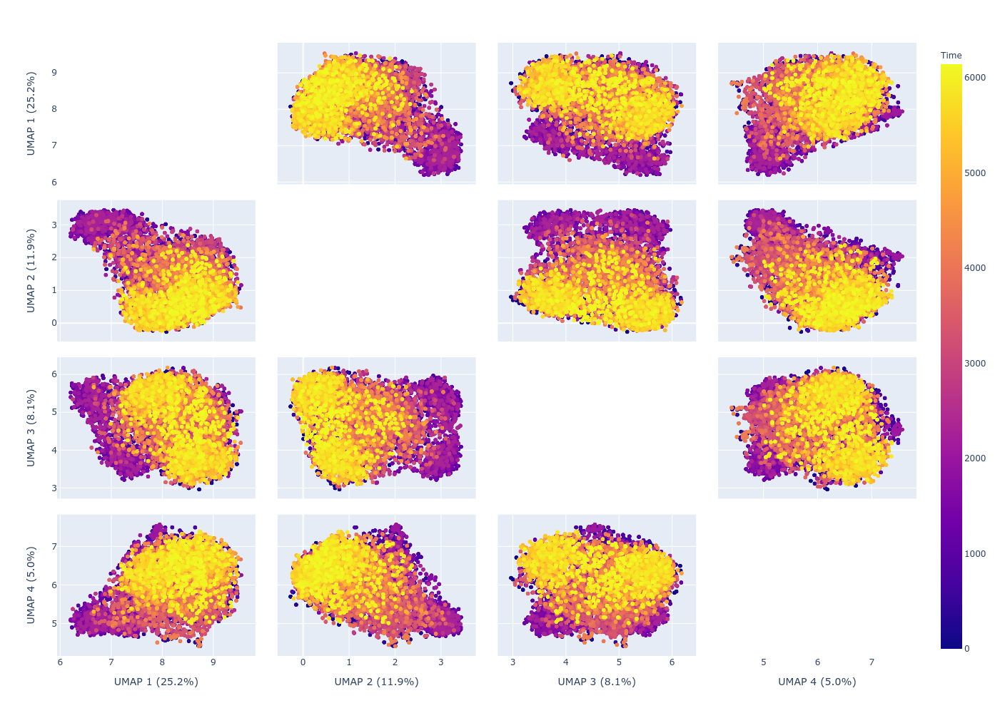

In [75]:
labels = {
    str(i): f"UMAP {i+1} ({var:.1f}%)"
    for i, var in enumerate(pca.explained_variance_ratio_ * 100)
}

fig = px.scatter_matrix(
    umapcomp,
    labels=labels,
    dimensions=range(4),
    color=np.arange(umapcomp.shape[0]),
   
)
fig.update_traces(diagonal_visible=False)
fig.update_layout(autosize=False,
                  coloraxis_colorbar=dict(title='Time'),
                  width=1000,
                  height=1000,
                  )
fig.show()

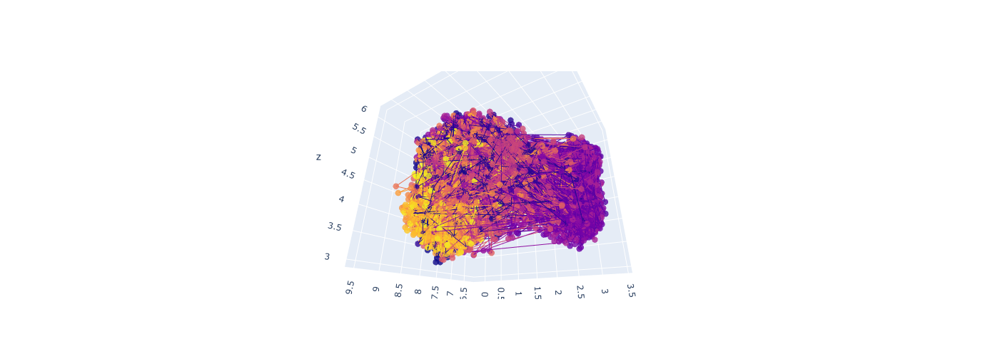

In [83]:
t = 0
dt = umapcomp.shape[0]
fig = go.Figure(data=[go.Scatter3d(x=umapcomp[t:t+dt,0], y=umapcomp[t:t+dt,1], z=umapcomp[t:t+dt,2],
                                   mode='lines + markers',
                                   marker=dict(
                                                size=5,
                                                color=np.arange(umapcomp[t:t+dt,0].shape[0]),
                                                opacity=0.8),
                                   line=dict(
                                             color=np.arange(umapcomp[t:t+dt,0].shape[0]),
                                             width=2)
                                   )])
fig.update_layout(autosize=False,
                  coloraxis_colorbar=dict(title='Time'),
                  width=500,
                  height=500,
                  )
fig.show()

# Sample Testing

In [10]:
num_samples = 100
z = torch.randn(num_samples,model.latent_dim)
z = z.to(device)
samples = model.decode(z)

Text(0.5, 1.0, 'Frames')

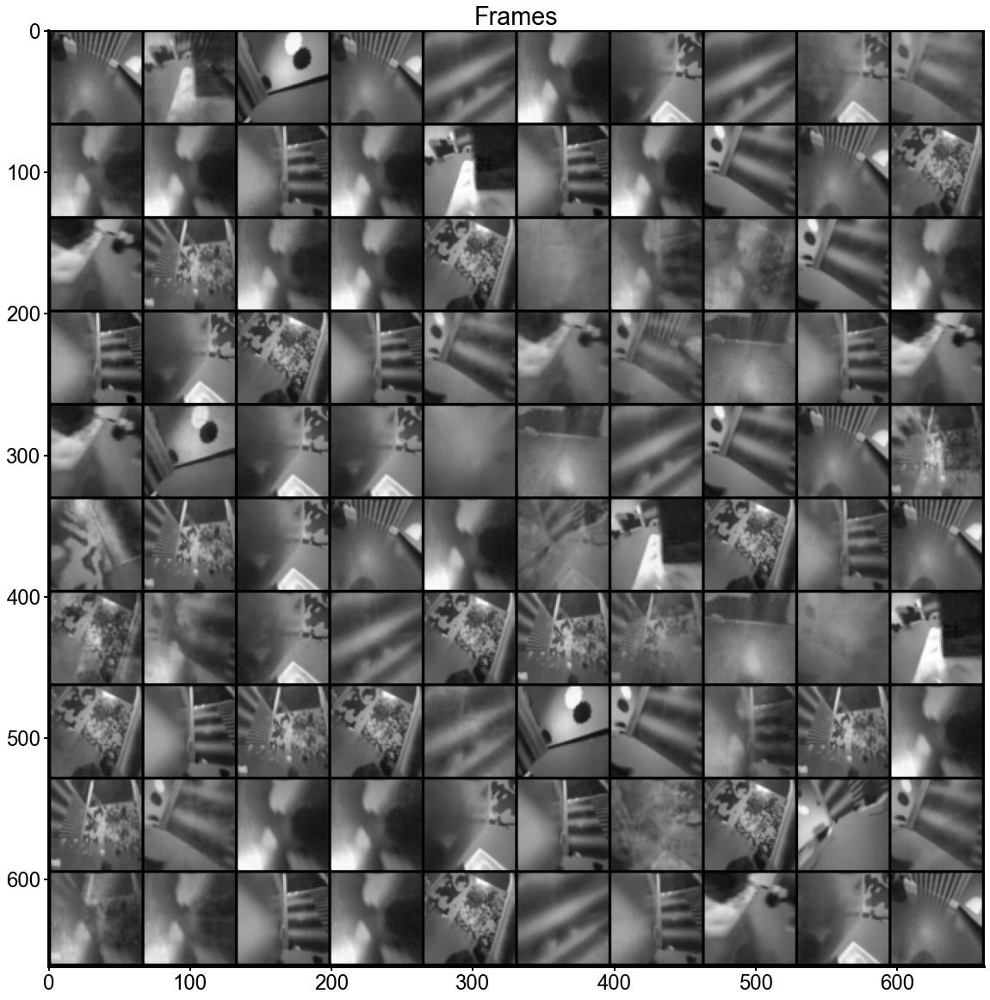

In [11]:
t=0
fig, axs = plt.subplots(1,figsize=(50,20))
# axs = axs.flatten()
# Image Frames
im_grid = torchvision.utils.make_grid(samples[:,:1].cpu(),nrow=10,normalize=True)
axs.imshow(im_grid.permute(1,2,0))
axs.set_title('Frames')

In [39]:
zt.shape

(6144, 128)

In [84]:
N_comp=128
pcaL = PCA(n_components=N_comp)

zcomps = pcaL.fit_transform(zt)

In [86]:
pcaL.components_.shape

(128, 128)

# PCA Testing on Image Frames

PCA on latent space vary top PC smoothly and decode. Then use covarience matrix from PCA to sample from normal distrubtion. 

In [30]:
from sklearn.decomposition import PCA


In [186]:
T = b1.shape[0]
b2b = np.concatenate((np.tile(b2[0],(3,1)),b2),axis=0)
b3 = np.empty((b2b.shape[0],b2b.shape[1]*4))
for t in trange(T-4):
    b3[t,:] = b2b[t:t+4].flatten()

  0%|          | 0/2044 [00:00<?, ?it/s]

In [31]:
b1 = batch.cpu().detach().numpy().squeeze()
b2 = b1.reshape(b1.shape[0],-1)

In [32]:
N_comp=128
pca = PCA(n_components=N_comp)

components = pca.fit_transform(b2)

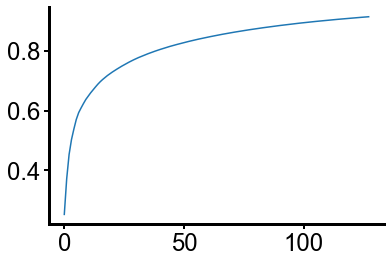

In [33]:
plt.plot(np.cumsum(pca.explained_variance_ratio_))

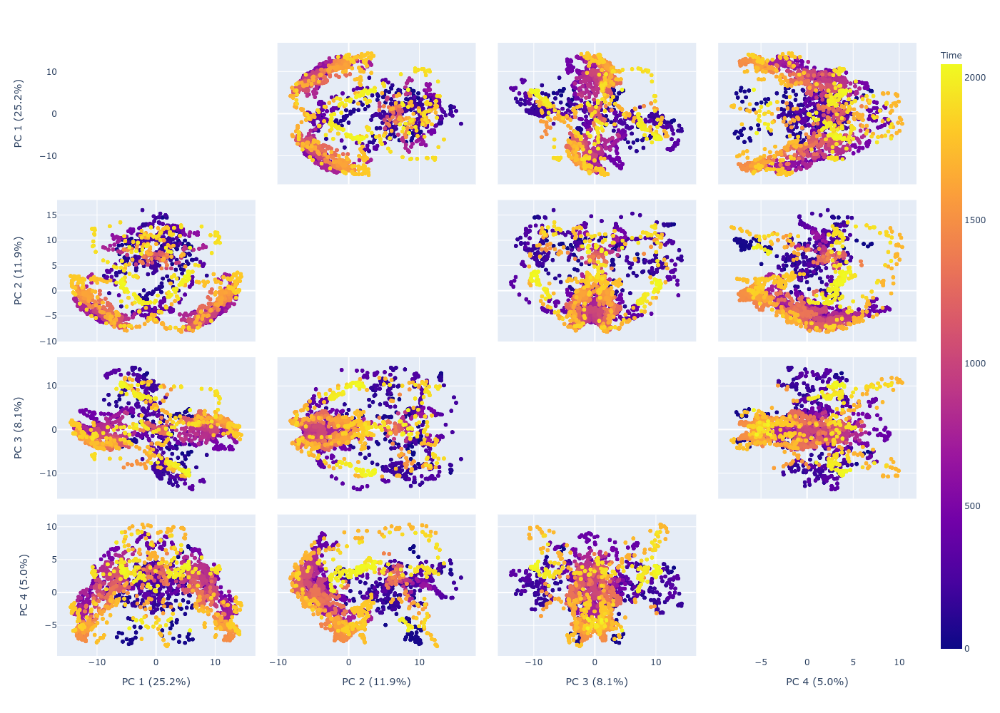

In [34]:
labels = {
    str(i): f"PC {i+1} ({var:.1f}%)"
    for i, var in enumerate(pca.explained_variance_ratio_ * 100)
}

fig = px.scatter_matrix(
    components,
    labels=labels,
    dimensions=range(4),
    color=np.arange(b2.shape[0]),
   
)
fig.update_traces(diagonal_visible=False)
fig.update_layout(autosize=False,
                  coloraxis_colorbar=dict(title='Time'),
                  width=1000,
                  height=1000,
                  )
fig.show()

In [217]:
components.shape

(2048, 128)

In [36]:
img2 = pca.inverse_transform(components)
img2 = img2.reshape(b1.shape)


In [37]:
comp = pca.components_.reshape(128,64,64)

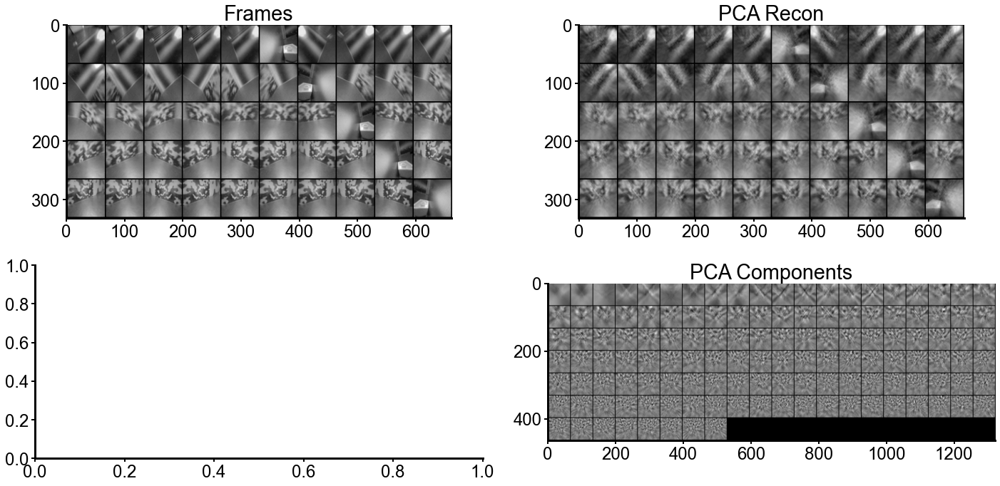

In [38]:
t=0
fig, axs = plt.subplots(2,2,figsize=(20,10))
axs = axs.flatten()
# Image Frames
im_grid = torchvision.utils.make_grid(batch.cpu()[t:t+50],nrow=10,normalize=True)
axs[0].imshow(im_grid.permute(1,2,0))
axs[0].set_title('Frames')

# PCA Reconstuction
im_grid2 = torchvision.utils.make_grid(torch.Tensor(img2[t:t+50,np.newaxis]),nrow=10,normalize=True)
axs[1].imshow(im_grid2.permute(1,2,0))
axs[1].set_title('PCA Recon')


im_grid3 = torchvision.utils.make_grid(torch.Tensor(comp[:,np.newaxis,:,:]),nrow=20,normalize=True)
axs[3].imshow(im_grid3.permute(1,2,0))
axs[3].set_title('PCA Components')

plt.tight_layout()
plt.show()

In [210]:
np.sqrt(128)

11.313708498984761